## ASSIGNMENT-3

TEAM-NAME:

IDs: 

NAMEs: 

### Instructions
 * Fill in the team name, id and names of all the teams members in the cell above.
 * Code must be written in Python in Jupyter Notebooks. We highly recommend using anaconda distribution or at the minimum, virtual environments for this assignment.
 * All the code and result files should be uploaded in the github classroom.
 * You can use the in-built methods and **unless explicitly mentioned**, don't need to code from scratch for this assignment. Make sure your code is modular.
 * All the representations are expected to be in a right-hand coordinate system. All the functions related to transformation matrices, quaternions, and 3D projection are expected to be coded by you.
 * You could split the Jupyter Notebook cells where TODO is written, but please try to avoid splitting/changing the structure of other cells.
 * All the visualization should be done inside the notebook unless specified otherwise.
 * Plagiarism will lead to heavy penalty.
 * Commit this notebook in the GitHub Classroom repo and any other results files under the result folder. 
 * Commits past the deadline will not be considered.
 * Extensions will be granted using the extension policy only, so please go through the policy carefully and reach out to the TAs beforehand.
 * **Download the data for section 2 and 3 from this [link](https://iiitaphyd-my.sharepoint.com/:f:/g/personal/pranjali_pathre_research_iiit_ac_in/Elm4OCxD4VhBh6f9x2ufKsgBnWwkmWc-nXPjnS5jXWRTww?e=IzOlbb)**.

In [1]:
# List the imports here

import numpy as np
import matplotlib.pyplot as plt
import cv2
from icecream import ic
import os
import open3d as o3d
import seaborn as sea
plt.style.use('seaborn')
np.__version__

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


/tmp/ipykernel_8457/4197023205.py:10: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


'1.24.3'

### SECTION 1: Epipolar lines and Epipoles

For this task, you have been given two images of the same scene taken from different view-points. You should first estimate the fundamental matrix that encodes their relative geometry from these two images.

<img src="data/1/img1.jpg" alt="image 1" width="400"/>
<img src="data/1/img2.jpg" alt="image 2" width="400"/>

Recall that given a point in one image, it's corresponding location in the other image can be found to along a line viz. the epipolar line. The task is to draw the epipolar lines in the second image for each given point in the first image. You have to repeat this for the other image as well. Draw epipolar lines on the first image for the corresponding points in the second image.

The convention used for F is $x'^{T}Fx$ where $x'$ is the location of the point in the second image. For this question you will need to compute the F matrix on your own without using inbuilt functions.

The point correspondences have been given in the folder `data/1`

In [4]:
##############################################################################
# TODO: Do tasks described in 1
##############################################################################


img1_c = np.array([[381, 402],[452, 497],[671, 538],[501, 254],[506, 381],[474, 440],[471, 537],[498, 364],[706, 319],[635, 367]])
img2_c = np.array([[390, 346],[439, 412],[651, 417], [477, 194], [482, 300], [456, 359], [454, 444], [475, 287], [686, 185], [606, 253]])

img1 = plt.imread('./data/1/img1.jpg')
img2 = plt.imread('./data/1/img2.jpg')


##############################################################################
# END OF YOUR CODE
##############################################################################

In [5]:

def get_T():
    scale =  2/ np.array([1280, 720])
    transformation = np.array([
        [scale[0], 0,        -1],
        [0,        scale[1], -1],
        [0,         0,        1]])
    
    return transformation

def apply_transformation(points, transformation):
    if len(points) == 1:
        points = points[0]
        return transformation @ np.array([points[0], points[1], 1])
    else:
        return np.column_stack((points, np.ones(len(points)))) @ transformation.T

def eight_point_algorithm(correspondences1, correspondences2):
    T = get_T()

    normalized_correspondences1 = apply_transformation(correspondences1, T)
    normalized_correspondences2 = apply_transformation(correspondences2, T)
    
    A = []
    for (x1, y1, _), (x2, y2, _) in zip(normalized_correspondences1, normalized_correspondences2):
        A.append([x1 * x2, x1 * y2, x1, y1 * x2, y1 * y2, y1, x2, y2, 1])

    A = np.array(A)

    U, S, Vt = np.linalg.svd(A)
    Fa = Vt[-1].reshape(3, 3)

    # Ua, Sa, Vta = np.linalg.svd(Fa)
    # Sa[-1] = 0
    # F_normalized = Ua @ np.diag(Sa) @ Vta

    return T, Fa

T, F = eight_point_algorithm(img1_c, img2_c)
T_inv = np.linalg.inv(T)
print("Fundamental matrix:\n", F)
np.linalg.norm(F)


Fundamental matrix:
 [[ 0.01540029 -0.55260267  0.28400818]
 [ 0.58226811 -0.00266407  0.15610519]
 [-0.47927252 -0.12914734 -0.06276317]]


1.0

In [6]:
ul = np.array([[381, 402]])
ur = np.array([[390, 346]])

ul = apply_transformation(ul, T)
ur = apply_transformation(ur, T)

ur @ F @ ul

# ur.T @ F @ ul

0.03590772318869104

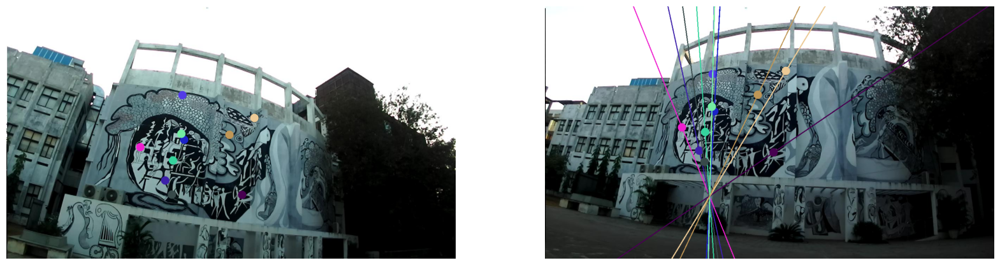

In [7]:
def get_two_points(f, u):
    u = apply_transformation([u], T)
    l = (f @ u).ravel()
    (u1, v1) = (-1, -(-l[0] + l[2])/l[1])
    (u2, v2) = (1, -(l[0] + l[2])/l[1])
    
    return apply_transformation([[u1, v1, 1]], T_inv), apply_transformation([[u2, v2, 1]], T_inv)

def create_epipolar_lines(F, l_points, r_points, l_img, r_img):
    
    for i, (p_1, p_2) in enumerate(zip(l_points, r_points)):
        p1, p2 = get_two_points(F, p_1)
        color = tuple(np.random.randint(0,255,3).tolist())
                
        l_img = cv2.circle(l_img.copy(), p_1, radius=2, color=color, thickness=20)
        r_img = cv2.circle(r_img.copy(), p_2, radius=2, color=color, thickness=20)
        r_img = cv2.line(
            r_img.copy(),
            tuple(int(i) for i in p1[:-1]), 
            tuple(int(i) for i in p2[:-1]), 
            color=color, 
            thickness=2
        )
    
    plt.figure(figsize=(20, 20))
    plt.subplot(1, 2, 1)
    plt.imshow(l_img)
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.imshow(r_img)
    plt.axis('off')
    plt.show()
    


create_epipolar_lines(F.T, img1_c, img2_c, img1.copy(), img2.copy())
    

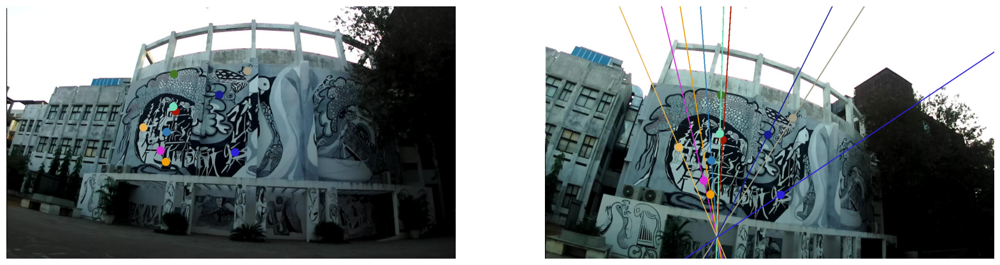

In [8]:
create_epipolar_lines(F, img2_c, img1_c, img2.copy(), img1.copy())

### SECTION 2: Visual Odometry

Visual odometry is the process of recovering the egomotion (the trajectory) of an agent using only the input from the camera or a system of cameras attached to the agent. This is a well-
studied problem in robotic vision and is a critical part of many applications such as mars rovers, and self-driving cars for localization. You will be implementing a basic monocular visual odometry algorithm in this part of the assignment.

To begin with, download all the required data from `data/2`. It contains a sequence of images from the KITTI dataset. The ground truth pose of each frame (in row-major order) and the camera parameters are provided as well.

#### Procedure
The following is an overview of the entire algorithm. 
1. Find the corresponding features between frames $I_{k}$ and $I_{k-1}$.
2. Using these features correspondances, estimate the essential matrix between the two images within a RANSAC sceme.
3. Decompose the essential matrix to obtain the relative rotation $R_k$ and transition $t_k$, and form the transformation $T_k$.
4. Scale the translation $t_k$ with the absolute or the relative scale. 
5. Concatenate the relative transformation by computing $C_k$ = $C_{k-1}$ $T_k$, where $C_{k-1}$ is the previous pose of the camera in the world frame. 
6. Repeat the above steps for the remaining pairs of frames.

The main task in computing visual odometry is to compute the relative transformation $T_k$ from each pair of images $I_k$ and $I_{k-1}$ and then to concatenate these transformations to recover the full trajectory of the camera. There are two broad approaches to compute the relative motion $T_k$: Appearance-based (or direct) method, which uses the intensity information of all the pixels in the input images and feature-based method which only uses salient and repeatable features extracted and tracked across the images. You will be implementing a feature-based method. 

For every new image $I_k$, the first step consists of detecting and matching 2D features with those from the previous frame. These 2D features are the locations in the image which we can reliably find in multiple images and possibly match them. To find these features use the inbuilt SIFT OpenCV implementation. 

Refer to [OpenCV documentation](https://docs.opencv.org/4.x/da/df5/tutorial_py_sift_intro.html) for the impementation details. 

As mentioned earlier, the main task is motion computation. Using these feature correspondences, implement the 8-point algorithm for fundamental matrix estimation. Implement it inside a RANSAC scheme to get rid of any outliers, as explained in class. Then, compute the essential matrix, and decompose it to the relative R and t using ```cv2.recoverPose```. Note that the function returns the R and t of the first camera with respect to the second, and not the other way around.

Now, you might recall that the absolute scale of the translation cannot be computed from just two images. The above function only returns the direction of t, as a unit vector. Use the ground truth translation to get the absolute scale, and multiply your unit translation with this scale. Then concatenate your transformations, and repeat for the next pair of frames to recover the full absolute trajector

Deliverables:
* A .txt file containing the estimated poses, provided in the same format as the ground truth.
* A plot of the estimated trajectory along with the ground truth trajectory. Also report the obtained trajectory error. Use [EVO](https://github.com/MichaelGrupp/evo) for this.
```
pip install evo --upgrade --no-binary evo
evo_traj kitti ground-truth.txt your-result.txt -va --plot --plot_mode xz
```
* Comment on the performance of your algorithm. When does it work well or it fails and why?

In [110]:
from tqdm.notebook import tqdm

# Function to extract SIFT features from a single image
def extract_sift_features(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(gray, None)
    return keypoints, descriptors

# Function to match features between two images
def match_features(descriptors1, descriptors2):
    bf = cv2.BFMatcher()
    matches = bf.knnMatch(descriptors1, descriptors2, k=2)
    good_matches = []
    for m, n in matches:
        if m.distance < 0.75 * n.distance:
            good_matches.append(m)
    return good_matches

# Function to normalize points
def normalize_points(points):
    norm_points = 2 * (points/np.array([1242, 375])) - 1
    return norm_points, 0, 0

# Function to compute the fundamental matrix using the 8-point algorithm
def compute_fundamental_matrix(matches, keypoints1, keypoints2):
    points1 = np.float32([keypoints1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    points2 = np.float32([keypoints2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

    # Normalize the points
    norm_points1, mean1, std1 = normalize_points(points1[:, 0])
    norm_points2, mean2, std2 = normalize_points(points2[:, 0])

    # Construct the matrix for the 8-point algorithm
    A = np.zeros((len(matches), 9))
    for i in range(len(matches)):
        A[i] = [norm_points1[i][0] * norm_points2[i][0], norm_points1[i][0] * norm_points2[i][1], norm_points1[i][0],
                norm_points1[i][1] * norm_points2[i][0], norm_points1[i][1] * norm_points2[i][1], norm_points1[i][1],
                norm_points2[i][0], norm_points2[i][1], 1]

    # Perform SVD on the matrix A
    _, _, V = np.linalg.svd(A)
    F = V[-1].reshape(3, 3)

    # Enforcing rank 2 constraint
    U, S, V = np.linalg.svd(F)
    S[-1] = 0
    F = np.dot(U, np.dot(np.diag(S), V))
    F = F/F[-1, -1]
    
    return F


K = np.array([[7.215377000000e+02,0.000000000000e+00,6.095593000000e+02],
                [0.000000000000e+00,7.215377000000e+02,1.728540000000e+02],
                [0.000000000000e+00,0.000000000000e+00,1.000000000000e+00]])


def sampson_distance(E, pt1, pt2):
        Ex = np.dot(E, pt1)
        Etx = np.dot(E.T, pt2)
        return (np.sum((pt2 * Ex)**2) + np.sum((pt1 * Etx)**2)) /(np.sum(Ex[0:2]**2 + Etx[0:2]**2))
    
def F_ransac(matches, keypoints1, keypoints2):
    current_inliers = []
    best_F = None
    for itr in range(100):
        indices = np.random.choice(len(matches), 8, replace=False)
        sampled_matches = [matches[i] for i in indices]
        F_now = compute_fundamental_matrix(sampled_matches, keypoints1, keypoints2)
        
        inliers = []
        
        if len(matches) > 1000:
            new_sampled_indices = np.random.choice(len(matches), 1000, replace= False)
            new_matches = [matches[i] for i in new_sampled_indices]
        else:
            new_matches = matches
            
        for match in new_matches:
            pt1, _, _ = normalize_points(np.array([keypoints1[match.queryIdx].pt[0], keypoints1[match.queryIdx].pt[1]]))
            pt2, _, _ = normalize_points(np.array([keypoints2[match.trainIdx].pt[0], keypoints2[match.trainIdx].pt[1]]))
                
            pt1 = np.array([pt1[0], pt1[1], 1])
            pt2 = np.array([pt2[0], pt2[1], 1])    
            
            distance1 = sampson_distance(F_now, pt1, pt2)
            
            if distance1 < 0.3: # Get the last stored transformation
                inliers.append(match)

        if len(inliers) > len(current_inliers):
            current_inliers = inliers
            best_F = F_now.copy()
        
    print(f"Found: {len(current_inliers)} inliners out of 1000")

    return best_F, current_inliers


In [111]:
image_path = "data/2/images/{:06d}.png"  # Updated format for 6-digit frame numbers

T_true = np.array([np.vstack((t.reshape(3, 4), [0, 0, 0, 1])) for t in np.loadtxt('./data/2/ground-truth.txt')])

first_frame = cv2.imread(image_path.format(0))
keypoints1, descriptors1 = extract_sift_features(first_frame)

num_frames = 80
translations = T_true[:, :, -1][:-1]

trajectory = [] 
trajectory.append(np.eye(4))


for i, frame_num in tqdm(enumerate(range(1, num_frames)), total=num_frames):

    current_frame = cv2.imread(image_path.format(frame_num))
    keypoints2, descriptors2 = extract_sift_features(current_frame)
    matches = match_features(descriptors1, descriptors2)
    
    best_F, inliers = F_ransac(matches, keypoints1, keypoints2)

    E = K.T @ best_F @ K
    
    pts1 = np.float32([keypoints1[m.queryIdx].pt for m in inliers]).reshape(-1, 2)
    pts2 = np.float32([keypoints2[m.trainIdx].pt for m in inliers]).reshape(-1, 2)
    
    
    pts1, _, _ = normalize_points(pts1)
    pts2, _, _ = normalize_points(pts2)

    retval, R, t, mask = cv2.recoverPose(E, pts1, pts2, K)
    
    scaled_translation = -np.linalg.norm(translations[frame_num][:3] - translations[frame_num - 1][:3]) * (t/np.linalg.norm(t))
    
    current_transform = np.zeros((4, 4))
    current_transform[:3, :3] = R.T
    current_transform[:3, 3] = scaled_translation.flatten()
    current_transform[3, 3] = 1

    new_transform = trajectory[-1] @ current_transform
    trajectory.append(new_transform)
    
    print(trajectory[-1])

    keypoints1, descriptors1 = keypoints2, descriptors2
    
    print("=" * 50)
    
    
output_file = "./data/2/estimated_poses.txt"
with open(output_file, "w") as f:
        for idx, transform in enumerate(trajectory):
            pose = f" ".join(map(str, transform.flatten().tolist()[:12]))
            f.write(pose + "\n")

  0%|          | 0/80 [00:00<?, ?it/s]

Found: 914 inliners out of 1000
[[ 0.99998993 -0.00436082 -0.0010603   0.61066975]
 [ 0.00436473  0.99998358  0.00371448  0.17306062]
 [ 0.00104408 -0.00371907  0.99999254 -0.72279926]
 [ 0.          0.          0.          1.        ]]
Found: 923 inliners out of 1000
[[ 9.99934687e-01  1.11294682e-02  2.59937635e-03 -8.60961303e-04]
 [-1.11046404e-02  9.99894363e-01 -9.37815730e-03 -2.76997581e-04]
 [-2.70347566e-03  9.34867965e-03  9.99952646e-01  1.06110054e-03]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
Found: 913 inliners out of 1000
[[ 0.99986494  0.01601117  0.00370633 -0.61268426]
 [-0.01595971  0.99978122 -0.01352018 -0.17376638]
 [-0.003922    0.0134592   0.99990173  0.72520817]
 [ 0.          0.          0.          1.        ]]
Found: 951 inliners out of 1000
[[ 0.99980696  0.01914654  0.00441102 -1.22267598]
 [-0.01907281  0.99968699 -0.01619107 -0.34669573]
 [-0.00471965  0.01610382  0.99985919  1.44720854]
 [ 0.          0.          0.          1

Because it takes a lot of time to run for 800 images, we have tried implementing our code for the first 80 images.

Our algorithm works well when:

1. Distinctive features are abundant for reliable matching.
2. Consistent, small camera motions between frames.
3. Minimal outliers due to robust estimation methods.
4. Sufficient overlap between frames for feature correspondence.
5. Accurate ground truth scale for absolute translation.

The algorithm may fail when there are:

1. Lack of distinctive features or presence of repetitive patterns.
2. Large camera motions or rapid movements.
3. Dynamic objects causing mismatches.
4. Insufficient overlap between frames.
5. Ambiguity in scale estimation or absent scale references.

In [112]:
!evo_traj kitti ./data/2/gt_poses_80.txt ./data/2/estimated_poses.txt --plot --plot_mode=xz 

--------------------------------------------------------------------------------
name:	gt_poses_80
infos:	30 poses, 26.274m path length
--------------------------------------------------------------------------------
name:	estimated_poses
infos:	80 poses, 51.796m path length


### SECTION 3: Stereo Dense Reconstruction

3-D point clouds are very useful in robotics for several tasks such as object detection, motion estimation (3D-3D matching or 3D-2D matching), SLAM, and other forms of scene understanding.  Stereo cameras provide  us  with  a  convenient  way  to  generate  dense  point  clouds. Dense here,  in  contrast  to sparse, means all the image points are used for the reconstruction.  In this part of the assignment you will be generating a dense 3D point cloud reconstruction of a scene from stereo images. Refer `data/3` folder. It contains `img2` and `img3` folder for left and right stereo images respectively. `poses.txt` contains flatten 12 values of transformation matrix for each pose and `calib.txt` contains `K & Baseline`.

#### Procedure

1. Generate a disparity map for all given stereo pair.  Use OpenCV (e.g.  StereoSGBM) for this.  Note that the images provided are already rectified and undistorted.
2. Then, using the camera parameters and baseline information generate colored point clouds from each disparity map.  Some points will have invalid disparity values, so ignore them. Use `Open3D` for storing your point clouds.
3. Register (or transform) all the generated point clouds into your world frame by using the provided ground truth poses.
4. Visualize the registered point cloud data, in color.  Use Open3D for this.

    
    
Write briefly about how the disparity map is generated (if you used SGBM, write about SGBM).

  0%|          | 0/21 [00:00<?, ?it/s]

/tmp/ipykernel_8457/2259208640.py:52: RuntimeWarning: divide by zero encountered in divide
  depth_map = np.where(disparity > 0, (f * b * 32) / disparity, 0.0)


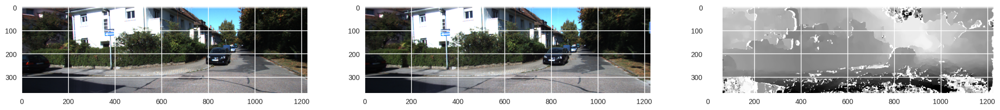

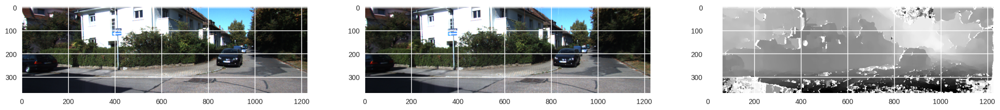

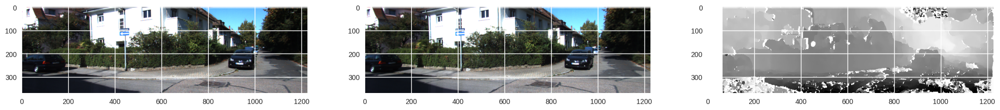

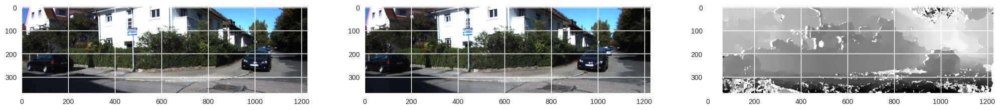

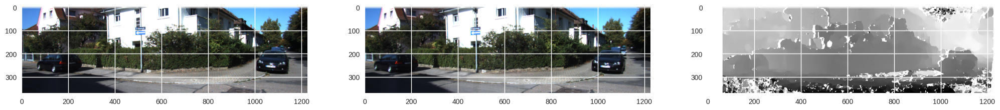

...

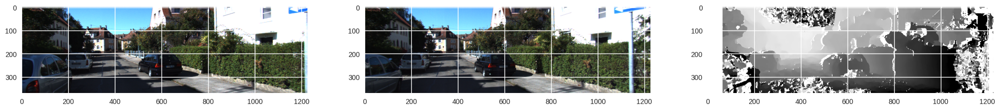

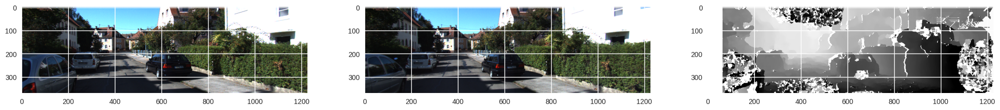

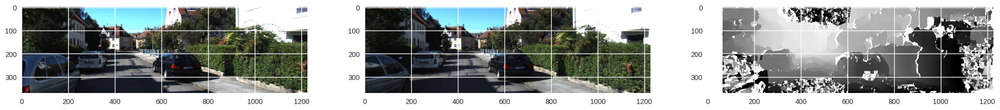

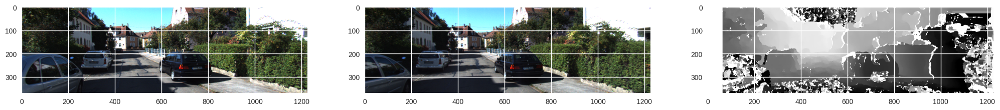

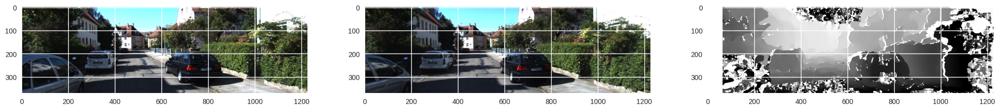

(5715828, 3) (5715828, 3)


In [109]:
##############################################################################
# TODO: Do tasks described in section 3
##############################################################################
from tqdm.notebook import tqdm

camera_matrix = np.array([7.070912e+02, 0.000000e+00, 6.018873e+02, 
                          0.000000e+00, 7.070912e+02, 1.831104e+02, 
                          0.000000e+00, 0.000000e+00, 1.000000e+00]).reshape(3, 3)
f, b = 7.070912e+02, 0.53790448812

T = np.array([np.vstack((t.reshape(3, 4), [0, 0, 0, 1])) for t in np.loadtxt('./data/3/poses.txt')])
first_frame_inv = np.linalg.inv(T[0])

T = np.array([first_frame_inv @ i for i in T])

img_left = sorted([os.path.join('./data/3/img2/', i) for i in os.listdir('./data/3/img2/')])
img_right = sorted([os.path.join('./data/3/img3/', i) for i in os.listdir('./data/3/img3/')])

def normalize_image(img):
    img = img - img.min()
    img = img/(img.max() - img.min())
    return img

def plot_pcd(pcd, colors, poses, not_o3d=False):
    
    if not_o3d:
        pcd = o3d.geometry.PointCloud(o3d.utility.Vector3dVector(pcd))
        pcd.colors = o3d.utility.Vector3dVector(colors)
        pcd = o3d.geometry.PointCloud.voxel_down_sample(pcd, voxel_size = 0.1)
        
        
    frame = o3d.geometry.TriangleMesh.create_coordinate_frame(size=5, origin=[0, 0, 0])    
    
    vis = o3d.visualization.Visualizer()
    vis.create_window()
    vis.add_geometry(frame)
    vis.add_geometry(pcd)

    vis.run()
    vis.destroy_window()
    # o3d.visualization.draw_geometries([pcd])
        

def stereo_dense_reconstruction(img1_path, img2_path, n_disparities, block_size, n):
    img1, img2 = cv2.imread(img1_path, 0), cv2.imread(img2_path, 0)

    stereo = cv2.StereoSGBM_create(numDisparities=n_disparities, blockSize=block_size)
    disparity = stereo.compute(img1, img2).astype(np.float32)

    depth_map = np.zeros_like(disparity).astype(np.float32)

    depth_map = np.where(disparity > 0, (f * b * 32) / disparity, 0.0)

    depth_map = depth_map + 1e-5
    
    plt.figure(figsize=(25, 15))
    plt.subplot(1,3,1)
    plt.title('left')
    plt.imshow(plt.imread(img1_path))
    
    plt.subplot(1,3,2)
    plt.title('right')
    plt.imshow(plt.imread(img2_path))
    
    plt.subplot(1,3,3)
    plt.title('disparity')
    plt.imshow(disparity, cmap='binary')
    
    plt.show()
    

    rgbd_image = o3d.geometry.RGBDImage.create_from_color_and_depth(
        o3d.geometry.Image((255 * plt.imread(img1_path)).astype(np.uint8)),
        o3d.geometry.Image(depth_map),
        depth_scale=1,
        depth_trunc=200, 
        convert_rgb_to_intensity=False  
    )
    
    intrinsic = o3d.camera.PinholeCameraIntrinsic()
    intrinsic.set_intrinsics(370, 1226, camera_matrix[0][0], camera_matrix[1][1], camera_matrix[0][2], camera_matrix[1][2])
    pcd = o3d.geometry.PointCloud.create_from_rgbd_image(
        rgbd_image,
        intrinsic   
    )
    
    pcd.transform(T[n])

    pcd = o3d.geometry.PointCloud.voxel_down_sample(pcd, voxel_size = 0.05)
    
    return np.asarray(pcd.points).copy(), np.asarray(pcd.colors).copy()

pcs, colors = [], []

for i, (img_l, img_r) in tqdm(enumerate(zip(img_left, img_right)), total=len(img_left)):

    pc_temp, color_temp = stereo_dense_reconstruction(img_l, img_r, n_disparities=64, block_size=20, n=i)    
    pcs.extend(pc_temp[:, :3])
    colors.extend(color_temp)
    
pcs, colors = np.array(pcs), np.array(colors)
print(pcs.shape, colors.shape)

plot_pcd(pcs, colors, T, not_o3d=True)
    
                
##############################################################################

SGBM or Semi-Global Block Matchin is a widely used method for computing disparity maps. The following is its working:

1. Rectification: Before computing the disparity map, stereo images are usually rectified to align the corresponding epipolar lines. This alignment simplifies the search for corresponding pixels in the stereo images.

2. Cost Computation: SGBM computes a cost volume by comparing pixel intensities between the left and right images along different disparity levels (horizontal offsets). It calculates the matching cost for each pixel at different disparities to determine the similarity between the corresponding pixels in both images.

3. Aggregation: The cost volume is then aggregated by applying a penalty function that considers not only the pixel-wise differences but also the disparities in neighboring regions. This step helps to minimize errors caused by noise or occlusions.

4. Disparity Calculation: After the aggregation, SGBM finds the disparity value (the horizontal shift) for each pixel by selecting the disparity value with the minimum accumulated cost. This value represents the distance between the corresponding points in the stereo images.

5. Post-processing: Finally, some post-processing techniques like disparity refinement, filtering, or interpolation can be applied to the disparity map to enhance its quality and accuracy.

The generated disparity map provides valuable depth information, where each pixel contains the estimated disparity value representing the distance or depth of the object corresponding to that pixel in the scene relative to the stereo camera setup. This depth information is crucial in various applications like 3D reconstruction, object detection, autonomous navigation, augmented reality, and more.